# Прекод

Необходимо разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные лежат в папке `/datasets/image_search/`.

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.286b55cf-503b-4573-8002-14abca686222

**Импортируем необходимые библиотеки**

In [1]:
import warnings
from tqdm import tqdm
from tqdm import notebook
tqdm.pandas()
import re
import os
import random

from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge


import numpy as np
import pandas as pd

from scipy import stats as st
import matplotlib.pyplot as plt
import seaborn as sns

# from collections import Counter
#from sklearn.feature_extraction.text import TfidfVectorizer
#import nltk
#from nltk.corpus import stopwords as nltk_stopwords
#from nltk.corpus import wordnet
#from nltk.stem import WordNetLemmatizer
#from nltk import pos_tag

warnings.filterwarnings( 'ignore' )

import torch
import torch.nn as nn
from pathlib import Path
import torchvision.models as models
from torchvision import transforms
from PIL import Image
import transformers

In [2]:
# !pip install -q transformers
# !pip install -q torchvision
# !pip install -q skorch
# !pip install -q sentence-transformers

In [3]:
#pip install --upgrade pip

In [4]:
# #сразу подготовим стоп-слова
# nltk.download('stopwords')
# stopwords = set(nltk_stopwords.words('english'))

In [5]:
seed = 12345

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.

Подготовимся к выгрузке и непосредственно выгрузим все.

In [6]:
# папка
path = 'datasets/to_upload/'

In [7]:
# таблички без "шапки". зададим

crowd_annotation_cols = ['image_name', 'image_id', 'pos_percentage', 'pos_amount', 'neg_amount']
expert_annotation_cols = ['image_name', 'image_id', 'expert_score_1', 'expert_score_2', 'expert_score_3']

In [8]:
# импортируем сразу все

df_expert = pd.read_csv(os.path.join(path, 'ExpertAnnotations.tsv'), sep='\t', names = expert_annotation_cols)
df_crowd = pd.read_csv(os.path.join(path, 'CrowdAnnotations.tsv'), sep='\t', names = crowd_annotation_cols)
df_text = pd.read_csv(os.path.join(path, 'train_dataset.csv'))
df_test = pd.read_csv(os.path.join(path, 'test_queries.csv'), index_col=[0], sep='|')

In [9]:
df_expert.head()

,image_name,image_id,expert_score_1,expert_score_2,expert_score_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [10]:
df_expert.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   image_name      5822 non-null   object
 1   image_id        5822 non-null   object
 2   expert_score_1  5822 non-null   int64 
 3   expert_score_2  5822 non-null   int64 
 4   expert_score_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


In [11]:
df_crowd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image_name      47830 non-null  object 
 1   image_id        47830 non-null  object 
 2   pos_percentage  47830 non-null  float64
 3   pos_amount      47830 non-null  int64  
 4   neg_amount      47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


С первого же взгляда видно, эксперты оценивали значительно меньше примеров. К тому же, возможно, не все примеры экспертов есть в примерах толпы.

Пропущенных значений нет ни в одной таблице.

In [12]:
df_expert.duplicated().sum()

0

In [13]:
df_expert.describe()

,expert_score_1,expert_score_2,expert_score_3
count,5822.000000,5822.000000,5822.000000
mean,1.436620,1.624356,1.881999
std,0.787084,0.856222,0.904087
min,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000
50%,1.000000,1.000000,2.000000
75%,2.000000,2.000000,2.000000
max,4.000000,4.000000,4.000000


Дубликатов в данных нет. Медианная оценка экспертов 1 и 2 - "1", эксперта 3 - "2", средние 1.2, 1.6, 1.9 соотвественно.

Общие границы ответов - от 1 до 4, корректные.

In [14]:
x1 = list(df_expert['expert_score_1'])
x2 = list(df_expert['expert_score_2'])
x3 = list(df_expert['expert_score_3'])
names = ['expert_score_1', 'expert_score_2', 'expert_score_3']

In [15]:
colors = ['#56B4E9', '#009E73', '#D55E00']

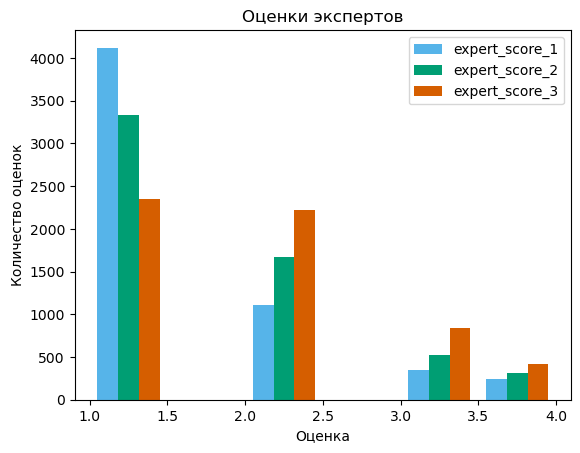

In [16]:
plt.hist([x1, x2, x3], bins = 6, color = colors, label= names)

plt.legend()
plt.xlabel('Оценка')
plt.ylabel('Количество оценок')
plt.title('Оценки экспертов')
plt.show;

Самый "ровный" эксперт - эксперт 3. Его оценки имеют явно меньший разброс, чем оценки категоричного эксперта 1. Эксперт 2 находится где-то между ними.

In [17]:
df_crowd.duplicated().sum()

0

In [18]:
df_crowd.describe()

,pos_percentage,pos_amount,neg_amount
count,47830.000000,47830.000000,47830.000000
mean,0.068786,0.208488,2.820155
std,0.207532,0.628898,0.656676
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,3.000000
50%,0.000000,0.000000,3.000000
75%,0.000000,0.000000,3.000000
max,1.000000,5.000000,6.000000


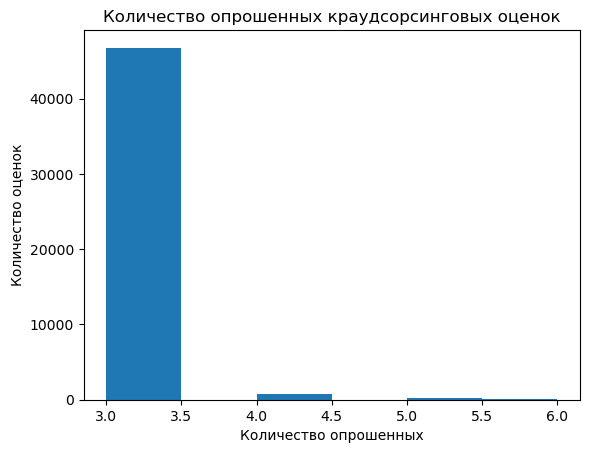

In [19]:
plt.hist(df_crowd['neg_amount'] + df_crowd['pos_amount'], bins = 6)

plt.xlabel('Количество опрошенных')
plt.ylabel('Количество оценок')
plt.title('Количество опрошенных краудсорсинговых оценок')
plt.show;

В подавляющем большинстве случаев опрашивают 3 людей, однако встречаются редкие случаи опроса 4, 5 и 6 людей.

In [20]:
df_crowd.head()

,image_name,image_id,pos_percentage,pos_amount,neg_amount
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


In [21]:
df_crowd.loc[df_crowd['pos_amount']>4].head()

,image_name,image_id,pos_percentage,pos_amount,neg_amount
21029,2933912528_52b05f84a1.jpg,3585487286_ef9a8d4c56.jpg#2,1.0,5,0
23836,3070031806_3d587c2a66.jpg,3070031806_3d587c2a66.jpg#2,1.0,5,0
24802,3113322995_13781860f2.jpg,1287073593_f3d2a62455.jpg#2,1.0,5,0
35007,3482974845_db4f16befa.jpg,3363750526_efcedc47a9.jpg#2,1.0,5,0
43444,466956209_2ffcea3941.jpg,466956209_2ffcea3941.jpg#2,1.0,5,0


Дубликатов в данных нет. Медианная краудсорсинговая оценка подтвердивших совпадение текста и картинки - 0, средняя - 0, среднее квадратическое отклонение - 0.2.

Количество "толпы" постоянно меняется. Какие-то примеры оценивает 3 человека, какие-то 6.

Общие границы ответов - от 0 до 1, корректные.

Использование этих оценок кажется некорректным из-за неоднородности данных в связи с разным количеством оценщиков и маловой вариативностью. Если пытаться учить  по этим данным, скорее всего она будет так же "вяло" предсказывать.

Чтобы понять, действительно ли эти данные такие "грязные", приведем оценки экспертов к одной в границах от 0 до 1, совместим таблицу по таблице экспертов (так как в ней значительно меньше данных) и проверим:

1. Все ли примеры есть в выборке с экспертами (если нет, то совмещать их нет никакого смысла, потому что данные будут превращены в разнородные);

2. Если примеры совпадают, то насколько отличается описание данных по варианту столбца экспертов и краудсорсинговой оценки.

In [22]:
df_expert.head()

,image_name,image_id,expert_score_1,expert_score_2,expert_score_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


Напишем функцию для агрегации мнения экспертов

Так как хочется учитывать мнение большинства, но при этом учитывать и эксперта с отличающимся мнением, то используем модифицированную формулу средневзвешенного. Если экспертов 3е, то мнение каждого - 1/3 от общего числа мнений. Соответственно добавим вес для каждой оценки в каждой конкретной строчке следующим порядком:

Если оценка встречается в наблюдении *один* раз, ее вес = 1/3;

Если оценка встречается в наблюдении *два* раза, ее вес = 2/3;

Если оценка встречается в наблюдении *три* разаа, ее вес = 3/3.

Итоговая формула:

$$
\frac{(y_1*w_1)+(y_2*w_2)+(y_3*w_3)}{(w_1+w_2+w_3)}
$$

где $ y_n = $ оценка n-ного эксперта,

$ w_n = $ вес оценки n-ного эксперта.

При этом "уравновешивать" таким образом оценки экспертов этот метод будет только в случае, если какая-то оценка повторяется дважды. Если же все оценки уникальны или одинаковы, то формула будет превращаться в обычное среднее.

Кроме того, сразу переведем полученное значение в границы от 0 до 1, по формуле простой нормализации x_norm = (x - min) / (max - min).

In [23]:
def custom_frac(row):
    scores = list(row[2:])
    counter = {}
    min_cf = 1 #  наши оценки min и max
    max_cf = 4 
    for e in scores:
        counter[e] = counter.setdefault(e, 0) + 1 #считаем количество повторений элемента
    weights = 0
    sum_ew = 0
    for e in scores:
        w = float(counter.get(e) * (1 / 3))  # умножаем долю одного вхождения на количество повторений в строчке
        sum_ew += float(e) * w  # sum_ew = ((y1 * w1) + (y2 * w2) + (y3 * w3))
        weights += w  # weights = (w1 + w2 + w3)
        av_weight = sum_ew / weights
    return (av_weight - min_cf) / (max_cf  - min_cf)

In [24]:
df_expert.head()

,image_name,image_id,expert_score_1,expert_score_2,expert_score_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [25]:
custom_frac(df_expert.loc[3])  # проверка

0.2666666666666668

In [26]:
df_expert['agg_score'] = df_expert.progress_apply(custom_frac, axis = 1)

100%|████████████████████████████████████████████████████████████████████████████| 5822/5822 [00:00<00:00, 9858.02it/s]


In [27]:
df_expert.head()

,image_name,image_id,expert_score_1,expert_score_2,expert_score_3,agg_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.066667
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.066667
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.266667
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.066667


Экспертные оценки агрегированы.

In [28]:
df_all = pd.merge(df_expert, df_crowd, how ='left', on = ['image_name', 'image_id'])

In [29]:
df_all.head()

,image_name,image_id,expert_score_1,expert_score_2,expert_score_3,agg_score,pos_percentage,pos_amount,neg_amount
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000,0.0,0.0,3.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.066667,0.0,0.0,3.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.066667,NaN,NaN,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.266667,NaN,NaN,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.066667,NaN,NaN,NaN


In [30]:
df_all = df_all.drop(['expert_score_1', 'expert_score_2', 'expert_score_3', 'pos_amount', 'neg_amount'], axis=1)

In [31]:
df_all.describe()

,agg_score,pos_percentage
count,5822.000000,2329.000000
mean,0.212794,0.198283
std,0.273327,0.343315
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.066667,0.000000
75%,0.333333,0.333333
max,1.000000,1.000000


Среднее и у экспертов, и у опросов - 0.2, медиана 0.07 и 0. соответственно. "Коробки с усами" не различаются крайними границами, толькосредним и медианой. Медиана и среднее экспертов чуть ближе друг д другу, нежели у результатов опроса, что говорит о меньшем количестве выбросов.

Кроме того, краудсорсинговых оценок в 2 раза меньше экспертных. Можно предположить, что у краудсорсинга меньше оценок положительных примеров (поэтому среднее 0) для оценки. Агрегировать эти оценки точно не будет хорошим решением, ведь их агрегация приведет к разнородности оценок (где-то учтен краудсорсинг, где-то нет, к тому же сам краудсорсинг неоднороден: где-то 6 оценщиков, где-то 3) и характеризует данные слишком по-разному.

Возможность объединения таблиц методом "inner" рассматривать не будем, потому что, во-первых, это приведет к потере примерно 50% данных, а, во-вторых, оценки краудсорсинга в коробке с усами слишком низкие и либо там рассмотрены только неудачные примеры, что даст неполноценную выборку, либо просто испортит уже существующий целевой признак.

In [32]:
del df_all  # эти таблицы больше не нужны
del df_crowd

Добавим в таблицу тексты запросов и проверим их наличие в принципе.

In [33]:
df_text.head()

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [34]:
df_train = pd.merge(df_expert, df_text, how ='inner', left_on = ['image_name', 'image_id'], right_on = ['image', 'query_id'])

In [35]:
df_train.head()

,image_name,image_id,expert_score_1,expert_score_2,expert_score_3,agg_score,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.066667,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.066667,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.266667,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.066667,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .


Приведем таблицу впорядок окончательно. Например, оценки экспертов уже не нужны.

In [36]:
for_drop = ['image_name', 'image_id', 'expert_score_1', 'expert_score_2', 'expert_score_3' ]

In [37]:
df_train = df_train.drop(for_drop, axis=1)

In [38]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   agg_score   5822 non-null   float64
 1   image       5822 non-null   object 
 2   query_id    5822 non-null   object 
 3   query_text  5822 non-null   object 
dtypes: float64(1), object(3)
memory usage: 182.1+ KB


In [39]:
len(df_expert) - len(df_train)

0

Для всех примеров с оценкой эксперта есть текст запроса.

In [40]:
del df_expert
del df_text

In [41]:
df_train

,agg_score,image,query_id,query_text
0,0.000000,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,0.066667,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...
2,0.066667,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .
3,0.266667,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...
4,0.066667,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .
...,...,...,...,...
5817,0.000000,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,People trackside at a subway station by a train .
5818,0.000000,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,A man sitting on a subway .
5819,0.066667,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,A man wearing a red hat looks down as another ...
5820,0.000000,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,A white birds lands swiftly in the water .


На всякий случай на последок проверим своими глазами парочка пар текст+картинка.

In [42]:
train_photos = df_train.sample(n=15)
train_photos.reset_index(drop = True, inplace=True)

Текст: Brown and white dog runs through brush .


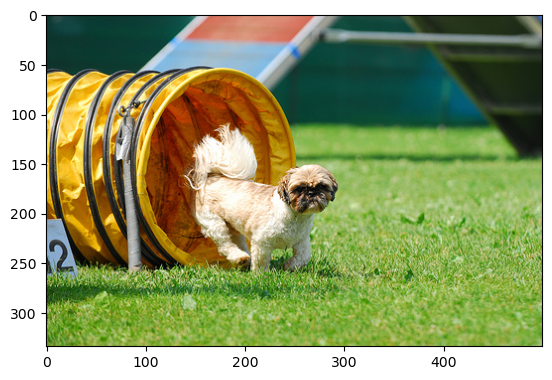

Текст: A cyclist in a helmet and yellow jersey .


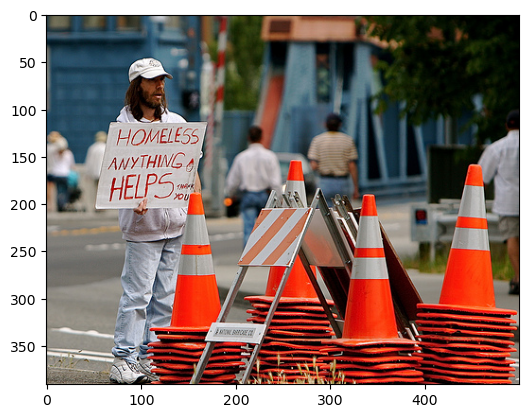

Текст: A woman plays with long red ribbons in an empty square .


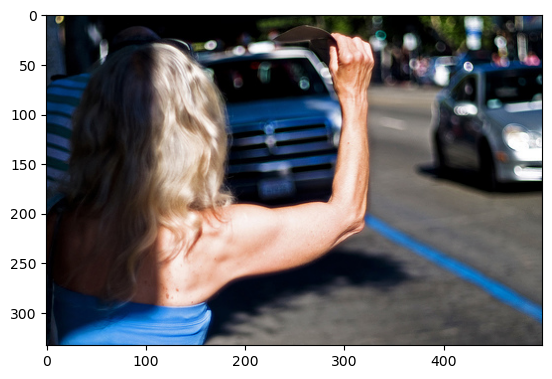

Текст: Four men jumping in a basketball game


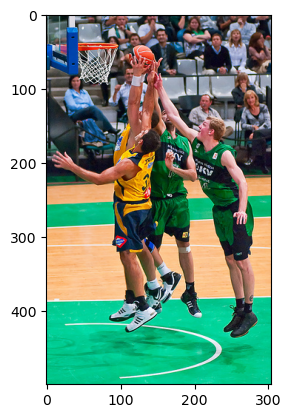

Текст: A dog leaps over a red and blue jump .


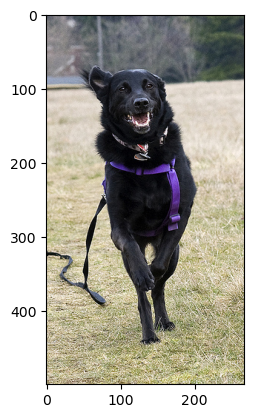

Текст: dogs playing in a stream


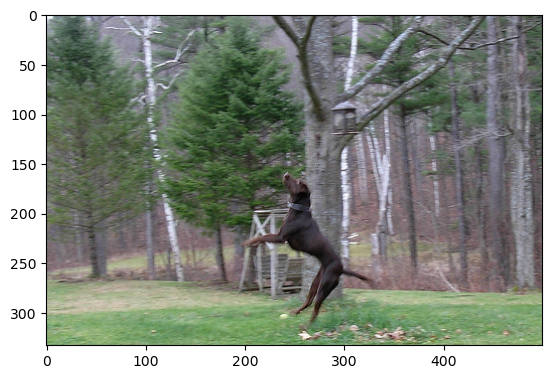

Текст: A person walks along the beach and leaves footprints in the sand .


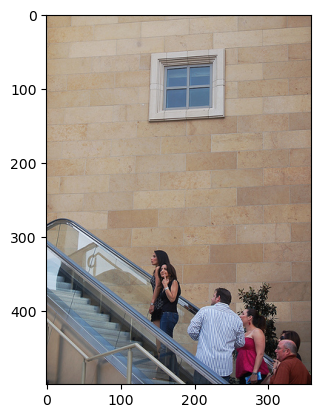

Текст: A man wearing a red hat looks down as another man watches .


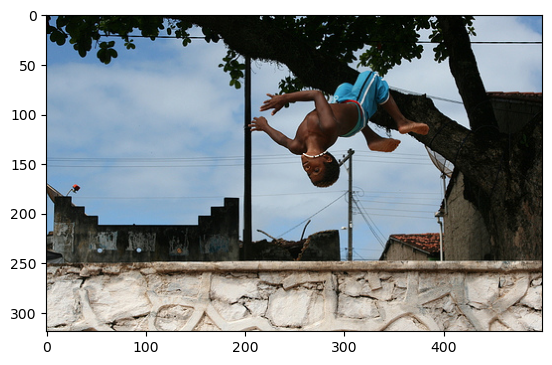

Текст: A man sleeps under a blanket on a city street .


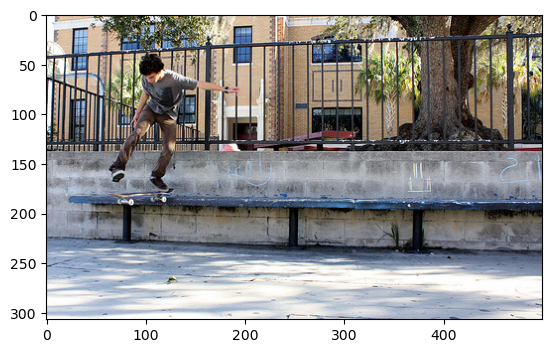

Текст: A smiling boy in an orange shirt with a safari hat sits at the playground , while a boy in a blue shirt looks on .


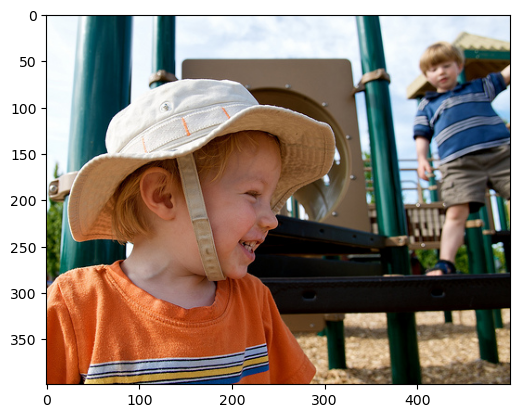

Текст: A baseman tries to catch a ball while a runner tries to make the base in a community game .


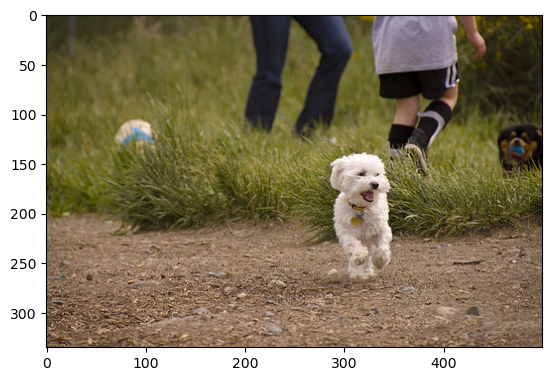

Текст: A little girl on a piece of playground equipment


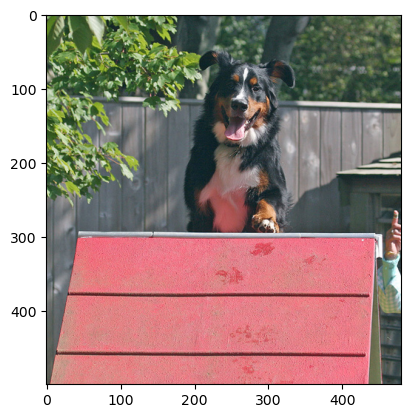

Текст: A little boy in navy blue is running very fast .


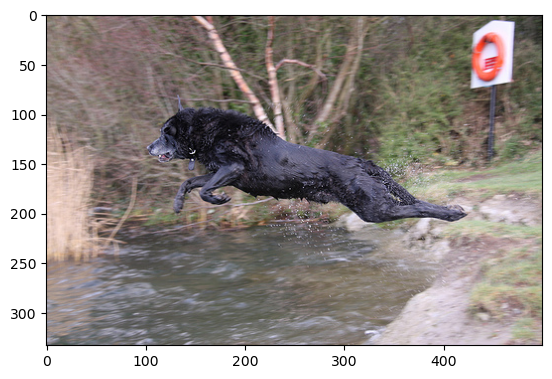

Текст: A dog wading into the water


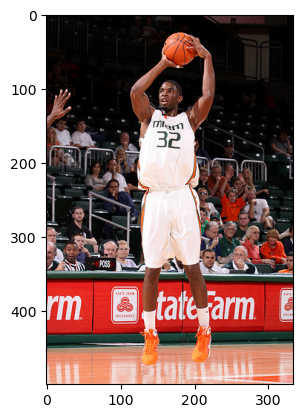

Текст: Two dogs moving through water close to the shore .


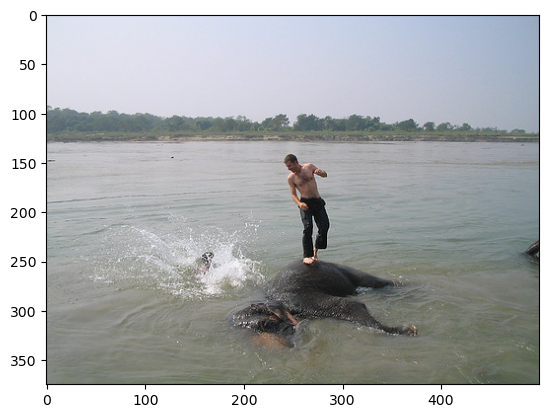

In [43]:
for i in range(0, 15):
    print('Текст:', train_photos.loc[i, 'query_text'])
    image = Image.open(Path(path,'train_images', train_photos.loc[i, 'image']))
    
                       
    plt.imshow(image)
    plt.show()

Понятно, почему эксперты чаще всего низко оценивают соответствие картинки и текста. Однако сами фотографии хорошего качества, без "уплывающих" пикселей или рамок. Однако объекты на фотографиях все время в совершенно разном положении, с разными элементами окружающего пространства. Задача явно будет непростая.

### Вывод

1. Пропущенных значений, дубликатов в таблицах нет.

2. Самый "добрый" эксперт - эксперт 3, его медианная оценка - 2, средняя 1.9. Самый суровый - эксперт 1. Медианная оценка 1, средняя - 1.2.

3. Медианная краудсорсинговая оценка подтвердивших совпадение текста и картинки - 0, средняя - 0, среднее квадратическое отклонение - 0.2. Количество "толпы" постоянно меняется. Какие-то примеры оценивает 3 человека, какие-то 6. Общие границы ответов - от 0 до 1, корректные, но сами данные неоднородны и недостаточно хорошо описывают особенности и взаимосвязи в данных.

4. Возможность объединения таблиц методом "inner" не рассматривается. Во-первых, это приведет к потере примерно 50% данных, а, во-вторых, оценки краудсорсинга в коробке с усами слишком низкие при высокой средней, что говорит о возможных выбросах, что при агрегации даст неполноценную выборку, или об оценках другого качества, которые испортят уже существующий целевой признак.

5. Данные краудсорсинговых и экспертных оценок не совпадают. Примеров общественного мнения значительно больше, чем экспертного мнения, но не для всех примеров с экспертными оценками существует краудсорсинговая оценка. Поэтому совместить экспертные и краудсорсинговые оценки не представляется возможным. *В работе используются только данные экспертных оценок.*

6. Для объединения экспертных оценок была применена модифицированная формула средневзвешенного, учитывающая повторяющие оценки и делая их вес больше в каждом конкретном примере.

7. Для всех примеров с оценкой эксперта есть текст запроса.

8. Итоговая таблица хранится в переменной df_train, содержит в себе 5 822 строки и столбики agg_score (агрегированная оценка экспертов в границах от 0 до 1), image (наименования файла с картинкой), query_id (идентификатор описания.) и query_text (непосредственно описание).

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Для начала необходимо создать список "запрещенных слов".

In [44]:
stop_words = ['child', 'children',
             'baby', 'babies', 
             'boy', 'boys',
             'girl', 'girls',
             'kid', 'kids',
             'infant', 'infants',
             'toddler', 'toddlers',
             'teenager', 'teenagers',
             'schoolboy', 'schoolgirl']

Напишем функцию-фильтр.

In [45]:
def bad_word_mask(row, stops = stop_words):
    text = row['query_text'].split()
    if [i for i in text if i in stops]:
        row['block'] = True
    else:
        row['block'] = False
    return row

Чтобы функция отработала корректно, приведем к одинаковому формату.

In [46]:
df_train['query_text'] = df_train['query_text'].str.lower()

In [47]:
df_train = df_train.progress_apply(bad_word_mask, axis=1)

100%|█████████████████████████████████████████████████████████████████████████████| 5822/5822 [00:07<00:00, 749.52it/s]


In [48]:
df_train.head()

,agg_score,image,query_id,query_text,block
0,0.000000,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,True
1,0.066667,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,a girl wearing a yellow shirt and sunglasses s...,True
2,0.066667,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,a man sleeps under a blanket on a city street .,False
3,0.266667,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,a woman plays with long red ribbons in an empt...,False
4,0.066667,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,chinese market street in the winter time .,False


In [49]:
df = df_train.loc[df_train['block'] == False]

In [50]:
df.head()

,agg_score,image,query_id,query_text,block
2,0.066667,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,a man sleeps under a blanket on a city street .,False
3,0.266667,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,a woman plays with long red ribbons in an empt...,False
4,0.066667,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,chinese market street in the winter time .,False
5,0.000000,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,a soccer ball is above the head of a man weari...,False
7,0.066667,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,a man and woman look back at the camera while ...,False


In [51]:
df.reset_index(drop = True)

,agg_score,image,query_id,query_text,block
0,0.066667,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,a man sleeps under a blanket on a city street .,False
1,0.266667,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,a woman plays with long red ribbons in an empt...,False
2,0.066667,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,chinese market street in the winter time .,False
3,0.000000,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,a soccer ball is above the head of a man weari...,False
4,0.066667,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,a man and woman look back at the camera while ...,False
...,...,...,...,...,...
4258,0.000000,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,people trackside at a subway station by a train .,False
4259,0.000000,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,a man sitting on a subway .,False
4260,0.066667,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,a man wearing a red hat looks down as another ...,False
4261,0.000000,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,a white birds lands swiftly in the water .,False


In [52]:
len(df) - len(df_train)

-1559

In [53]:
len(df_train)

5822

In [54]:
len(df)

4263

### Вывод

Обучающая выборка была очищена от примеров с изображениями детей и уменьшилась примерно на 25%.

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

Так как модель предварительно натренирована, заморозим веса.
Выполним поставленную задачу следующим образом:

1. Инициализируем претренированную сверточную сеть ResNet18;

2. Так модель натренирована, заморозим веса;

3. Посмотрим на структуру нейросети;

4. Исключим полносвязные слои, отвечающие за конечное предсказание.

In [55]:
resnet = models.resnet18(pretrained=True)

In [56]:
# замораживаем веса

for param in resnet.parameters():
    param.requires_grad_(False)

In [57]:
# посмотрим все дочерние модули в ResNet

print(list (resnet.children()))

[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU(inplace=True), MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False), Sequential(
  (0): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (1): BasicBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bia

In [58]:
# создаем список всех слоев, за исключением слоя-предсказания
modules = list(resnet.children())[:-1]

# убираем последний слой из ResNet модели, оставляя все остальные слои
resnet = nn.Sequential(*modules)

# переводим в режим предсказания
resnet.eval()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Con

Изображения в нашем наборе данных имеют разные размеры. Нужно стандартизировать их перед подачей на вход. Для этого:

1. Применим нормализацию (transforms.Normalize) к изображениям с указанными значениями среднего (mean) и стандартного отклонения (std) для каждого из трех каналов изображения (R, G, B).

2. Создадим цепочку преобразований (transforms.Compose), которые будут применяться к изображениям. Преобразования включают изменение размера изображения до 256x256 пикселей, вырезание центральной области размером 224x224 пикселя и преобразование изображения в тензор.

In [59]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    norm,
])

Наконец-то превратим изображения в векторы.

In [60]:
image_embeddings = []

train_photos = list(df['image'])
for i in notebook.tqdm(range(len(train_photos ))):
    image = Image.open(Path(path,'train_images', train_photos[i])).convert('RGB')  # открытое изображение конвертируется в RGB
    image_tensor  = preprocess(image)  # подготавливаем изображение для подачи в модель с помощью ранее созданной цепочкой преобразований
    output_tensor = resnet(image_tensor.unsqueeze(0)).flatten()  # передаеv в предобученную модель ResNet для извлечения эмбеддинга
    image_embeddings.append(output_tensor.cpu().numpy())  # добавляем результат в список

  0%|          | 0/4263 [00:00<?, ?it/s]

In [61]:
features_image = np.asarray(image_embeddings)
features_image.shape

(4263, 512)

### Вывод

Для векторизации изображений была использована предобученная модель с замороженными весами без последнего слоя для предсказания ResNet18 с использованием библиотеки PyTorch. Изображения перед подачей в такую модель подверглись таким изменениям как нормализация, изменение размера, вырезание части от центра. Итоговые эмбеддинги были преобразованы в массив NumPy для удобства дальнейшей обработки.

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.

Будем использовать TF-IDF, но перед этим надо подготовить данные и сделать следующие действия:

1. Тексты в проекте написаны латиницей, поэтому вполне достаточно кодировки по умолчанию, ее не трогаем. Сам текст ранее был приведен к одному регистру в п. 2 работы. Теперь стоит очистить текст (оставить только слова и избавиться от возможных лишних пробелов). Для этого напишем и используем функцию **clear_text**;

2. Чтобы слова лемматизировались корректно, создадим и используем функцию POS-тегирований **get_wordnet_pos**;

3. Непосредственно лемматизируем слова созданной функцией **lemmatize**;

4. Разделим выборку на обучающую-валидационную (тестовая представлена в отдельном файле) в соотвествии с концептом работы.

Только после этого посчитаем TF-IDF для корпусов текстов.

In [62]:
# #очистка

# def clear_text(text):
#     text = text.lower()  # оставим для обработки текстов тестовой выборки
#     text = re.sub(r'[^a-z]', ' ', text)   
#     text = ' '.join(text.split())
#     return text

In [63]:
# #POS-тегирование для функции lemmatize

# def get_wordnet_pos(word):
#     tag = nltk.pos_tag([word])[0][1][0].upper()
#     tag_dict = {"J": wordnet.ADJ,               #прилагательное
#                 "N": wordnet.NOUN,              #существительное
#                 "V": wordnet.VERB,              #глагол
#                 "R": wordnet.ADV                #наречие
#                }  
#     return tag_dict.get(tag, wordnet.NOUN)

In [64]:
# #Лемматизация

# lemmatizer = WordNetLemmatizer()

# def lemmatize(text):
#     t = [lemmatizer.lemmatize(word, get_wordnet_pos(word)) for word in nltk.word_tokenize(text)]
#     return ' '.join(t)

In [65]:
# df['lemm_text'] = df['query_text'].progress_apply(clear_text)

In [66]:
# df['lemm_text'] = df['lemm_text'].progress_apply(lemmatize)

In [67]:
# count_tf_idf = TfidfVectorizer(stop_words = list(stopwords), decode_error = 'replace', lowercase = False)  # если в тестовой/валид выборке есть новые слова
#                                                                                                          # заменим их "масками" (decode_error='replace')

In [68]:
# features_text = count_tf_idf.fit_transform(features_train['lemm_text'].values)

Так как в общем итоге TF-IDF не дала хорошего результата, будем использовать BERT следующим образом.

In [69]:
# Сначала создадим объект модели BERT и токенизатор для предобученной модели "bert-base-uncased"

model = transformers.BertModel.from_pretrained('bert-base-uncased')
tokenizer = transformers.BertTokenizer.from_pretrained('bert-base-uncased')

In [70]:
# Текстовые данные предобрабатываем (токенизируем, добавляем специальные токены, учитываем максимальную длину, обрезка при необходимости до 128)
tokenized = df['query_text'].apply(
    lambda x: tokenizer.encode(x, add_special_tokens=True, max_length=128, truncation=True))

# вычисляем максимальную длину данных
max_len = max([len(i) for i in tokenized.values])
print(max_len)

# создаем матрицу, выравнивая до максимальной длины добавлением нулей
padded = np.array([i + [0] * (max_len - len(i)) for i in tokenized.values])

# активные токены - 1, а паддинги - 0
attention_mask = np.where(padded != 0, 1, 0)

36


In [71]:
batch_size = 147 #при таком батч сайзе получим целочисленное деление и нужный размер векторов ( (4263/147) * 147 = 4263 )
embeddings = []

In [72]:
# извлечем эмбеддинги текста из модели
for i in notebook.tqdm(range(padded.shape[0] // batch_size)):
    # тензор с пакетом данных батча
    batch = torch.LongTensor(padded[batch_size*i:batch_size*(i+1)])
    # тензор маски внимания для соответствующего батча
    attention_mask_batch = torch.LongTensor(attention_mask[batch_size*i:batch_size*(i+1)])
    # без градиентов
    with torch.no_grad():
        batch_embeddings = model(batch, attention_mask=attention_mask_batch)
        # добавляем результаты
        embeddings.append(batch_embeddings[0][:,0,:].cpu().numpy())

  0%|          | 0/29 [00:00<?, ?it/s]

In [73]:
# объединим результат
features_text = np.concatenate(embeddings)
features_text.shape

(4263, 768)

### Вывод

Для векторизации текста была использована предобученная модель BERT с использованием библиотеки PyTorch, специальными токенами BERT и маской внимания.

## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [74]:
features = np.concatenate((features_image, features_text), axis=1)
features.shape

(4263, 1280)

In [75]:
target = np.array(df['agg_score'])
target.shape

(4263,)

### Вывод

Данные объединены с помощью библиотеки NumPy. Все данные на месте.

## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

### Определение задачи и метрики

Для начала определимся с метрикой. Перед нами стоит задача регрессии, обучение с учителем: нужно предсказать значение от 0 до 1.

Самимы первыми на ум приходят MAE и RMSE. Так как RMSE более критична к выбросам, будет использовать ее как основную метрику.

### Подготовка данных к обучению

In [76]:
gss = GroupShuffleSplit(n_splits=1, train_size=.8, random_state=seed)
train_indices, test_indices = next(gss.split(X=features, y=target, groups=df['image']))
train_features, test_features = features[train_indices], features[test_indices]
train_target, test_target = target[train_indices], target[test_indices]

In [77]:
print(train_features.shape)
print(train_target.shape)
print(test_features.shape)
test_target.shape

(3424, 1280)
(3424,)
(839, 1280)


(839,)

Мы будем использовать регрессию, а, значит, признаки надо масштабировать.

In [78]:
scaler = StandardScaler().fit(train_features)
train_features = scaler.transform(train_features)
test_features = scaler.transform(test_features)

Сбор результатов осуществим в табличке

In [79]:
analytics = pd.DataFrame(columns=['model', 'rmse_val'])
analytics

,model,rmse_val


### Простая линейная регрессия

In [80]:
model_lr = LinearRegression()
model_lr.fit(train_features, train_target)
predict_lr = model_lr.predict(test_features)
rmse_lr = mean_squared_error(test_target, predict_lr, squared=False)
print('RMSE:', rmse_lr)
print('MAE:', mean_absolute_error(test_target, predict_lr))

RMSE: 0.3814843867638075
MAE: 0.2776134280598159


In [81]:
analytics.loc[0] = ['LinearRegression', rmse_lr]

### Линейная регрессия с регуляризацией Ridge

In [82]:
model_rd = Ridge(random_state=seed, alpha = 50)
model_rd.fit(train_features, train_target)
predict_rd = model_rd.predict(test_features)
rmse_rd = mean_squared_error(test_target, predict_rd, squared=False)
print('RMSE:', rmse_rd)
print('MAE:', mean_absolute_error(test_target, predict_rd))

RMSE: 0.288591394476214
MAE: 0.22272005292172936


In [83]:
analytics.loc[1] = ['Ridge', rmse_rd ]

In [84]:
analytics

,model,rmse_val
0,LinearRegression,0.381484
1,Ridge,0.288591


### Полносвязная нейронная сеть

In [85]:
# подготовка для модели
x_train = torch.FloatTensor(train_features)
x_test = torch.FloatTensor(test_features)
y_train = torch.FloatTensor(train_target)
y_test = torch.FloatTensor(test_target)

In [86]:
print(x_train.size())
print(y_train.size())
print(x_test.size())
print(y_test.size())

torch.Size([3424, 1280])
torch.Size([3424])
torch.Size([839, 1280])
torch.Size([839])


In [87]:
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.use_deterministic_algorithms(True)

Создадим класс.

Перед нами стоит задача регрессии, а это значит, что в качестве функции активации можно использовать Linear, ReLU ее разновидности и Swish. Попробуем ReLU, так она решает потенциальную проблему затухающего градиента и быстро рассчитывается. Swish обычно используется в сложных сетях с количеством скрытых слоев более 40. Смысла создавать огромное количество слоев и использовать свиш нет.

In [88]:
class Model(nn.Module):
    def __init__(self, n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_hidden_neurons_3, n_out_neurons):
        super(Model, self).__init__()
        
        self.fc1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
        self.act1 = nn.ReLU()
        self.fc2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)
        self.act2 = nn.ReLU()
        self.fc3 = nn.Linear(n_hidden_neurons_2, n_hidden_neurons_3)
        self.act3 = nn.ReLU()
        self.fc4 = nn.Linear(n_hidden_neurons_3, n_out_neurons)

    def forward(self, x):
        x = self.fc1(x)
        x = self.act1(x)
        x = self.fc2(x)
        x = self.act2(x)
        x = self.fc3(x)
        x = self.act3(x)
        x = self.fc4(x)

        return x

Задаем переменные с количеством нейронов в разных слоях.

В соответствии с задачей регрессии также выбираем функцию потери можно из MSE и MAE. Используем MSE, так как мы будем оценивать модели на RMSE.

In [89]:
n_in_neurons = train_features.shape[1] #количество признаков
n_hidden_neurons_1 = 15
n_hidden_neurons_2 = 10
n_hidden_neurons_3 = 7
n_out_neurons = 1

net = Model(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_hidden_neurons_3, n_out_neurons)
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3)
loss = nn.MSELoss()

In [90]:
test_loss_list = []
train_loss_list = []
num_epochs = 1000
best_rmse = 1000

for epoch in range(num_epochs):
    train_preds = net.forward(x_train).flatten()
    train_loss = loss(train_preds, y_train)
    train_loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    net.eval()
    test_preds = net.forward(x_test).flatten()
    test_loss = loss(test_preds, y_test)
    rmse_test = torch.sqrt(test_loss).item()
    rmse_train = torch.sqrt(train_loss).item()
    test_loss_list.append(torch.sqrt(test_loss).item())
    train_loss_list.append(torch.sqrt(train_loss).item())
    if rmse_test < best_rmse:
        best_rmse = rmse_test
        best_epoch = epoch
        loss_train = rmse_train
        best_preds = test_preds
print(f'Best_epoch {best_epoch}, Best RMSE train {loss_train}, Best RMSE test {best_rmse}')

Best_epoch 78, Best RMSE train 0.20166078209877014, Best RMSE test 0.2530415952205658


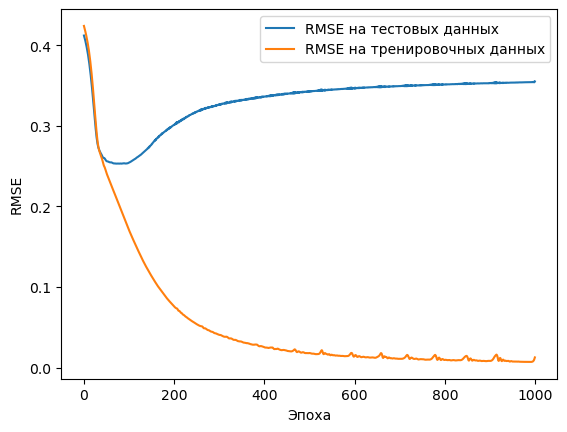

In [91]:
plt.plot(test_loss_list, label='RMSE на тестовых данных')
plt.plot(train_loss_list, label='RMSE на тренировочных данных')
plt.xlabel('Эпоха')
plt.ylabel('RMSE')
plt.legend()
plt.show()

Примерно после 150 эпохи начинается серьезное переобучение. Посмотрим поближе на "безопасный" кусочек и поэкспериментируем.

In [92]:
n_in_neurons = train_features.shape[1] #количество признаков
n_hidden_neurons_1 = 15
n_hidden_neurons_2 = 10
n_hidden_neurons_3 = 8
n_out_neurons = 1

net = Model(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_hidden_neurons_3, n_out_neurons)
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3)
loss = nn.MSELoss()

test_loss_list = []
train_loss_list = []
num_epochs = 150
best_rmse = 1000

for epoch in range(num_epochs):
    train_preds = net.forward(x_train).flatten()
    train_loss = loss(train_preds, y_train)
    train_loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    net.eval()
    test_preds = net.forward(x_test).flatten()
    test_loss = loss(test_preds, y_test)
    rmse_test = torch.sqrt(test_loss).item()
    rmse_train = torch.sqrt(train_loss).item()
    test_loss_list.append(torch.sqrt(test_loss).item())
    train_loss_list.append(torch.sqrt(train_loss).item())
    if rmse_test < best_rmse:
        best_rmse = rmse_test
        best_epoch = epoch
        loss_train = rmse_train
        best_preds = test_preds
print(f'Best_epoch {best_epoch}, Best RMSE train {loss_train}, Best RMSE test {best_rmse}')

Best_epoch 67, Best RMSE train 0.20804820954799652, Best RMSE test 0.24322959780693054


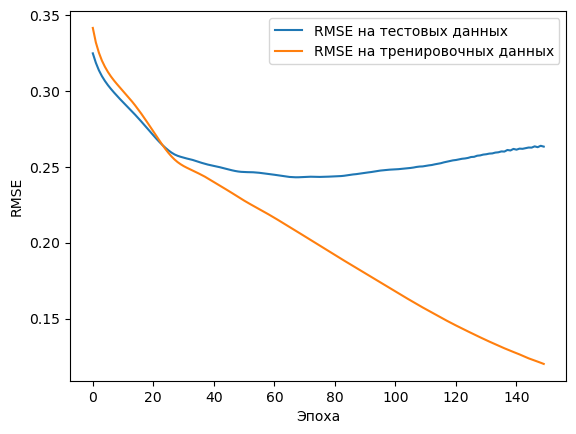

In [93]:
plt.plot(test_loss_list, label='RMSE на тестовых данных')
plt.plot(train_loss_list, label='RMSE на тренировочных данных')
plt.xlabel('Эпоха')
plt.ylabel('RMSE')
plt.legend()
plt.show()

In [94]:
class Model_d(nn.Module):
    def __init__(self, n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_hidden_neurons_3, n_out_neurons, dropout=0.25):
        super(Model_d, self).__init__()
        
        self.fc1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
        self.act1 = nn.ReLU()
        self.dp2 = nn.Dropout(p=dropout)
        self.fc2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)
        self.act2 = nn.ReLU()
        self.fc3 = nn.Linear(n_hidden_neurons_2, n_hidden_neurons_3)
        self.act3 = nn.ReLU()
        self.fc4 = nn.Linear(n_hidden_neurons_3, n_out_neurons)

    def forward(self, x):
        x = self.fc1(x)
        x = self.act1(x)
        x = self.dp2(x)
        x = self.fc2(x)
        x = self.act2(x)
        x = self.fc3(x)
        x = self.act3(x)
        x = self.fc4(x)

        return x

In [95]:
n_in_neurons = train_features.shape[1] #количество признаков
n_hidden_neurons_1 = 15
n_hidden_neurons_2 = 10
n_hidden_neurons_3 = 8
n_out_neurons = 1

net = Model_d(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_hidden_neurons_3, n_out_neurons)
optimizer = torch.optim.Adam(net.parameters(), lr = 1e-3)
loss = nn.MSELoss()

test_loss_list = []
train_loss_list = []
num_epochs = 79
best_rmse = 1000

for epoch in range(num_epochs):
    train_preds = net.forward(x_train).flatten()
    train_loss = loss(train_preds, y_train)
    train_loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    net.eval()
    test_preds = net.forward(x_test).flatten()
    test_loss = loss(test_preds, y_test)
    rmse_test = torch.sqrt(test_loss).item()
    rmse_train = torch.sqrt(train_loss).item()
    test_loss_list.append(torch.sqrt(test_loss).item())
    train_loss_list.append(torch.sqrt(train_loss).item())
    if rmse_test < best_rmse:
        best_rmse = rmse_test
        best_epoch = epoch
        loss_train = rmse_train
        best_preds = test_preds
print(f'Best_epoch {best_epoch}, Best RMSE train {loss_train}, Best RMSE test {best_rmse}')

Best_epoch 73, Best RMSE train 0.1785798817873001, Best RMSE test 0.24122032523155212


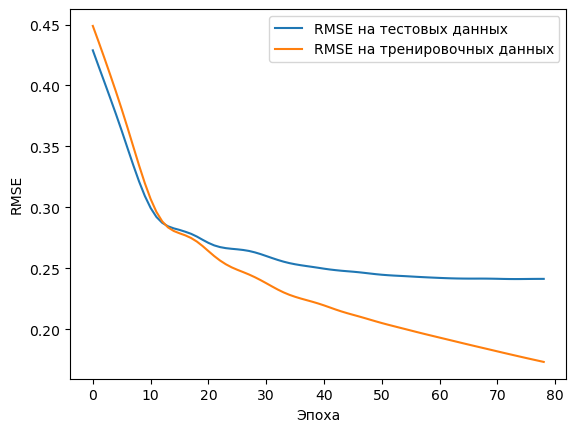

In [96]:
plt.plot(test_loss_list, label='RMSE на тестовых данных')
plt.plot(train_loss_list, label='RMSE на тренировочных данных')
plt.xlabel('Эпоха')
plt.ylabel('RMSE')
plt.legend()
plt.show()

Выглядит очень неплохо, мы немного исправили проблему с переобучением.

In [97]:
analytics.loc[2] = ['Net', best_rmse]
analytics

,model,rmse_val
0,LinearRegression,0.381484
1,Ridge,0.288591
2,Net,0.241220


### Вывод

Были созданы 3 модели предсказаний:

1. Самая простая линейная регрессия (LinearRegression), которая показала RMSE на валидационной выборке 0.38;

2. Линейная регрессия с регуляризацией Ridge, с alpha = 50 показавшая RMSE на валидационной выборке 0.29;

3. Простая двухслойная нейронная сеть с добавлением dropout для уменьшения переобучения показавшая RMSE на валидационной выборке 0.24.

Архитектура лучшего предсказателя-нейронной сети получилась следующей:

- Входной слой с количеством нейронов, равным количеству признаков.
- Скрытый слой 1 с 15 нейронами n_hidden_neurons_1, активация ReLU.
- Dropout слой с коэффициентом dropout=0.25 для регуляризации.
- Скрытый слой 2 с 10 нейронами n_hidden_neurons_2, активация ReLU.
- Скрытый слой 3 с 8 нейронами n_hidden_neurons_3, активация ReLU.
- Выходной слой с 1 нейроном.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [98]:
# перебираем все изображения, чтобы создать их вектора 
df_image = pd.DataFrame(df_test.image.unique(), columns=['image'])
print(len(df_image))

100


In [99]:
image_embeddings_test = []
test_photos = list(df_image['image'])
for i in notebook.tqdm(range(len(test_photos))):
    image = Image.open(Path(path,'test_images', test_photos[i])).convert('RGB')
    image_tensor  = preprocess(image)
    output_tensor = resnet(image_tensor.unsqueeze(0)).flatten()
    image_embeddings_test.append(output_tensor.cpu().numpy())

  0%|          | 0/100 [00:00<?, ?it/s]

In [100]:
test_image = np.asarray(image_embeddings_test)
test_image.shape

(100, 512)

In [101]:
# также напишем функцию обработки уникальных описаний по аналогии с предыдущим подходом

def get_embed(data, model, tokenizer ):
    df_text = pd.DataFrame(data, columns=['text'])
    tokenized = df_text['text'].apply(lambda x: tokenizer.encode(x, add_special_tokens=True, max_length=128, truncation=True))
    max_len = max([len(i) for i in tokenized.values])
    padded = np.array([i + [0]*(max_len - len(i)) for i in tokenized.values])
    attention_mask = np.where(padded != 0, 1, 0)
    embeddings_text = []
    batch = torch.LongTensor(padded)
    attention_mask_batch = torch.LongTensor(attention_mask)
    with torch.no_grad():
        batch_embeddings = model(batch, attention_mask=attention_mask_batch)

    embeddings_text.append(batch_embeddings[0][:,0,:].cpu().numpy())
   
    return embeddings_text

In [102]:
def get_picture_net(text):
    text_split = text.split()

    # осталась задача с на экранным предупреждением
    if [i for i in text_split if i in stop_words]:
        print('')
        print(text)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
    else:
        # получаем эмбеддинг текста если запрос легален
        text_embed = get_embed(model=model, data=[text], tokenizer=tokenizer)
        # объединение вектора картинок с вектором текста
        X = np.concatenate((test_image, np.resize(text_embed, (test_image.shape[0],768))), axis=1)
        X = scaler.transform(X)
        X = torch.FloatTensor(X)
        with torch.no_grad():
            # предсказания оценок
            predictions = net.forward(X).flatten()
        # добавляем оценки к номерам картинок
        df = pd.concat([df_image, pd.Series(np.reshape(predictions, (predictions.shape[0])), name='pred')], axis=1)
        
        # топ 5 имён файлов с картинками
        top = list(df.sort_values(by='pred', ascending=False)['image'].head(5))
        # выводим 5 лучший картинок-сопадений
        fig = plt.figure(figsize=(20,5))
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(len(top)):
            fig.add_subplot(1, 6, i+1)
            image = Image.open(Path(path, 'test_images', top[i])).convert('RGB')

            plt.suptitle(text, fontsize=15)
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

In [103]:
samples = df_test.sample(10)
text_test = list(samples['query_text'])
text_test

['A dog is wearing jeans and a blue and yellow shirt with a black vehicle in the background .',
 'While holding tight to the ball , the man in red socks is getting tackled .',
 'A dog is dressed in a shirt and pants on the side of the road .',
 'a biker rides down the street .',
 'a kickboxer jumping for a kick',
 'A young boy wearing a red shirt stands in the street with his arms open wide .',
 'A woman in purple with two children in the mouth of a cave .',
 'A little girl dressed in a pink shirt , blue shorts and a pink hair ribbon feeding ducks that are swimming in water .',
 'a family standing in a rock cave with some of their belongings in the background',
 'Three people are looking into photographic equipment .']


A young boy wearing a red shirt stands in the street with his arms open wide .

This image is unavailable in your country in compliance with local laws.

A woman in purple with two children in the mouth of a cave .

This image is unavailable in your country in compliance with local laws.

A little girl dressed in a pink shirt , blue shorts and a pink hair ribbon feeding ducks that are swimming in water .

This image is unavailable in your country in compliance with local laws.


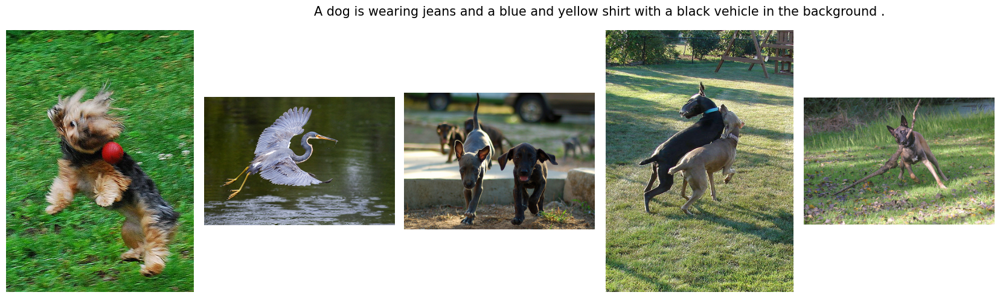

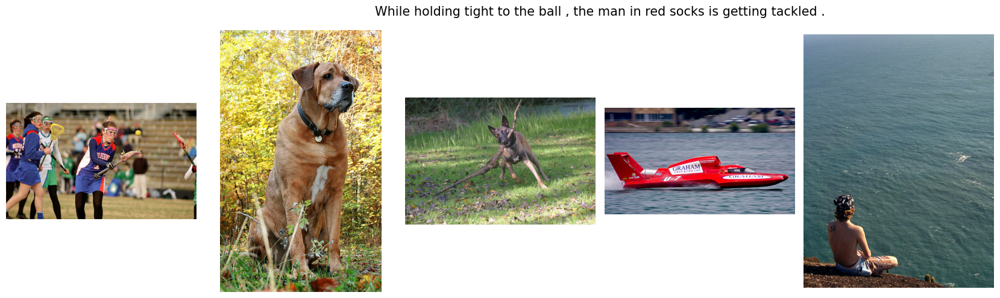

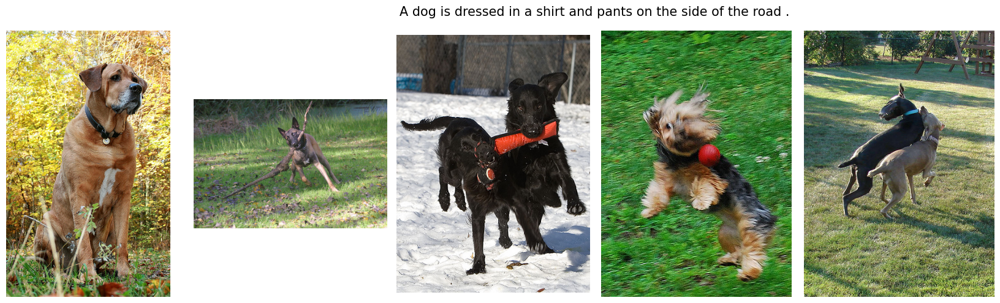

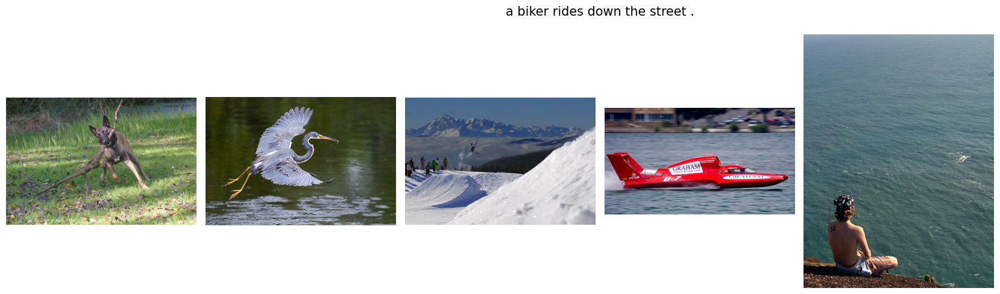

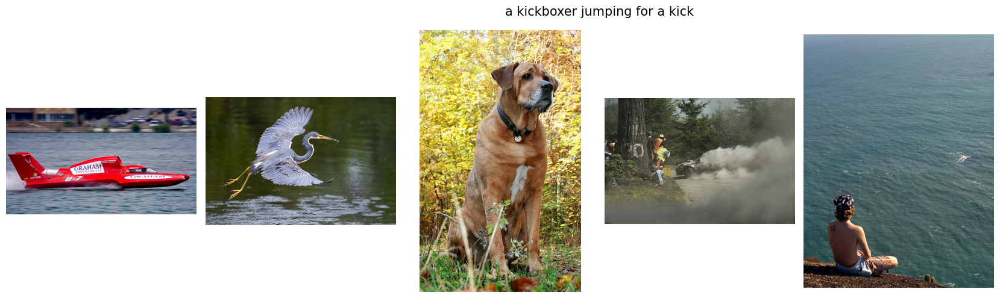

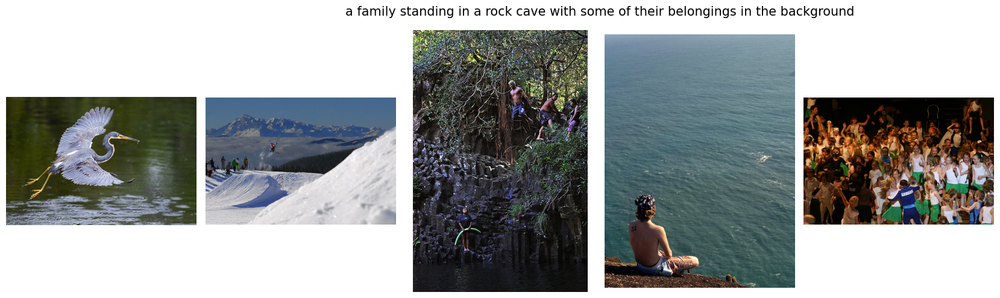

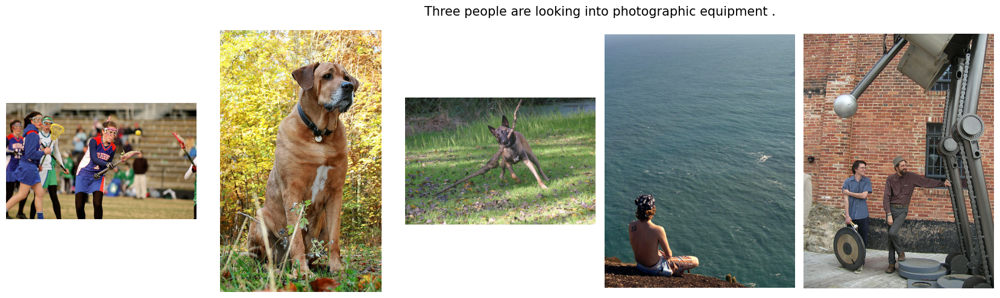

In [104]:
for t in text_test:
    get_picture_net(t)

### Вывод

Модель не очень хорошо угадывает картинки по тексту. Возможно, следует попробовать что-то значительно более сложное, типа предсказания какой вектор картинки будет предсказан по этому вектору текста, без оценок совпадения. Особенно понравилась модели светлая и яркая картинка с оранжевой собакой. В общем и целом модель более-менее может отличить животное от человека, но с машинами, летательными средствами и прочей техникой, а так же с родом деятельности человека на картинке ей прихоится совсем туго.

## 8. Общие выводы

Исходная задача -  разработать демонстрационную версию поиска изображений по тексту-запросу. Модель должна получать на вход векторное представление изображения и текста, а на выходе выдаст число от 0 до 1.

Поставенная задача была задачей регрессии, обучение с учителем. Она была решена следующим образом:

1. Сначала данные были изучены. На данном этапе было определено, что пропущенных значений или несоответствующих оценок (меньше 1 или больше 4) (или же меньше 0 и больше 1 в случае краудсорсинга) в данных нет. Дубликаты также не нашлись;

2. Также выяснилось, что краудсорсинговых оценок в разы больше, чем оценок экспертов, но они не очень однородны (от 3 до 6 голосующих, 0 в нижней границе коробки с усами, 0 по медиане), да и ситуаций, в которых присутствовала бы и оценка экспертов, и оценка краудсорсинга была невелика. В связи с этим на этом шаге было решено использовать исключительно оценки экспертов;

3. Оценки экспертов агрегировались по модифицированной средневзвешенной;

4. Векторы изображения были получены с помощью предобученной модели resnet18 с замороженными весами и без последнего полносвязного слоя предсказаний;

5. Эмбеддинги текста были извлечены с помощью модель BERT с использованием библиотеки PyTorch, специальными токенами BERT и маской внимания;

6. После полученные векторы изображений и текстов были объеденины;

7. Для оценки предсказания была выбрана метрика RMSE, так она более чувствительна к выбросам;

8. Для предсказания использовались модели:
      - LinearRegression() (RMSE - 0.38);
      
      - Ridge(random_state=seed, alpha = 50) (RMSE - 0.29);
      
      - Простая двухслойная нейронная сеть с добавлением dropout для уменьшения переобучения (RMSE - 0.24);
  
9. Лучше всех показала себя нейронная сеть с архитектурой:

    - Входной слой с количеством нейронов, равным количеству признаков;

    - Скрытый слой 1 с 15 нейронами n_hidden_neurons_1, активация ReLU;

    - Dropout слой с коэффициентом dropout=0.25 для регуляризации;

    - Скрытый слой 2 с 10 нейронами n_hidden_neurons_2, активация ReLU;

    - Скрытый слой 3 с 8 нейронами n_hidden_neurons_3, активация ReLU.

    - Выходной слой с 1 нейроном;
  
10. И, наконец, была написана функция для тестирования лучшей модели, которая:
    
    - Проверяла, является ли запрос легитимным и не обрабатывала его, если в тексте содержались упоминания детей;
    
    - Созавала вектора изображений и текста, объединяла их;
  
    - Предсказывала наилучшие совпадения картинки-текста;
  
11. Сама модель не очень хорошо предсказывает совпадения, но неплохо отличает людей от собак. В идеале, возможно, стоит попробовать и другие варианты или вообще попробовать кардинально другой подход, но времени не хватает даже для того, чтобы попробовать усовершенствовать уже существующий. Также можно попробовать подход обучения на примерах, которых 100% подходят друг к другу. Сейчас их очень мало и примеров несоответствия больше.

## 9. Выводы

- Jupyter Notebook открыт
- Весь код выполняется без ошибок
- Ячейки с кодом расположены в порядке исполнения
- Исследовательский анализ данных выполнен
- Проверены экспертные оценки и краудсорсинговые оценки
- Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- Изображения векторизованы
- Текстовые запросы векторизованы
- Данные корректно разбиты на тренировочную и тестовую выборки
- Предложена метрика качества работы модели
- Предложена модель схожести изображений и текстового запроса
- Модель обучена
- По итогам обучения модели сделаны выводы
- Проведено тестирование работы модели
- По итогам тестирования визуально сравнили качество поиска